# Table of Contents
* [Instructions](#Instructions)
* [Python Import](#Python-Import)
* [Homogeneous Cylinder (radius r1)](#Homogeneous-Cylinder-%28radius-r1%29)
	* [Create Correction Algorithm](#Create-Correction-Algorithm)
	* [Testing Correction Algorithm](#Testing-Correction-Algorithm)
		* [Create Fake Cylindrical Data Set](#Create-Fake-Cylindrical-Data-Set)
		* [Get Projected Image Over x-axis](#Get-Projected-Image-Over-x-axis)
		* [Apply Correction to Recover Homogeneous Profile](#Apply-Correction-to-Recover-Homogeneous-Profile)
* [Inhomogeneous Cylinder (radius r1 inside Cylinder of radius r2)](#Inhomogeneous-Cylinder-%28radius-r1-inside-Cylinder-of-radius-r2%29)
	* [Create Correction Algorithm](#Create-Correction-Algorithm)
	* [Testing Correction Algorithm](#Testing-Correction-Algorithm)
		* [Create Fake Cylindrical Data Set](#Create-Fake-Cylindrical-Data-Set)
		* [Get Projected Image Over x-axis](#Get-Projected-Image-Over-x-axis)
		* [Apply Correction to Recover from Inhomogeneous Profile](#Apply-Correction-to-Recover-from-Inhomogeneous-Profile)


# Instructions 

In this notebook, I will study how to figure out the relation between the distance d (horizontal distance from the center) and the relative projection (perpendicular to the image)

# Python Import 

In [25]:
from plotly.offline import plot, init_notebook_mode, iplot
init_notebook_mode()
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools

import numpy as np

from IPython.display import Image
from IPython.core.display import HTML

import matplotlib.pyplot as plt
%matplotlib inline

# Homogeneous Cylinder (radius r1) 

## Create Correction Algorithm 

In [26]:
Image(url="images/homogeneous_cylinder.png", width=300, height=300, unconfined=True)

In [27]:
r1 = 300
d = np.arange(-r1, r1, 0.01)
rp = 2*r1*np.sin(np.arccos(d/r1))

trace = go.Scatter(x=d,
                  y=rp,
                  name='rp')
coeff_correction = 2*r1-rp
trace_2 = go.Scatter(x=d,
                    y=coeff_correction,
                    name='Intensity correction')

layout = go.Layout(title="Projected Intensity vs d",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="Projected Intensity"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [28]:
factor = (2*r1)/rp
factor[0] = np.NaN

trace = go.Scatter(x=d,
                  y=factor)
layout = go.Layout(title="Coeff. Factor",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="factor"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [29]:
trace = go.Scatter(x=d,
                y=factor*rp)
layout = go.Layout(title="Profile After Correction",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="factor",
                            range=[0,650]))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

## Testing Correction Algorithm 

### Create Fake Cylindrical Data Set

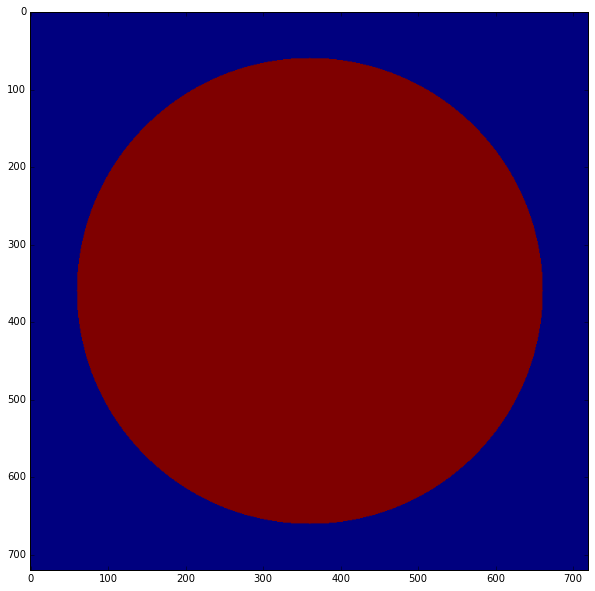

In [30]:
intensity = 2
r=r1
width=height=2*r

def is_point_inside_circle(x,y):
    _r = x*x + y*y
    if np.sqrt(_r) <= r:
        return True
    return False

border = np.int(r/5)
x_range = np.arange(-r-border,r+border)
y_range = np.arange(-r-border,r+border)

circle_matrix_bool = np.empty([len(y_range), len(x_range)], dtype=np.bool)
for x in x_range:
    for y in y_range:
        _result = is_point_inside_circle(x, y)
        circle_matrix_bool[x+r+border, y+r+border] = _result
        
circle_matrix = np.zeros([len(y_range), len(x_range)])
circle_matrix[circle_matrix_bool] = intensity

fig =  plt.figure(figsize=(10,10))
ax_img = plt.subplot(111)
ax_img.imshow(circle_matrix)

### Get Projected Image Over x-axis 

In [31]:
projected_image = np.sum(circle_matrix, axis=0)

trace = go.Scatter(y=projected_image)
layout = go.Layout(title="Projected Image",
                  xaxis=dict(title="Counts"),
                  yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [32]:
# find center, radius and truncate array

center = np.int(len(x_range)/2)
radius = r

projected_image_only = projected_image[center - radius:center + radius + 1]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

### Apply Correction to Recover Homogeneous Profile

In [33]:
def factor(position=0, radius=1):
    rp = 2*radius*np.sin(np.arccos(position/radius))
    if position == 0:
        return 1
    return (2*radius)/rp

In [36]:
d = np.arange(-r, r)
intensity = projected_image_only[np.int(len(projected_image_only)/2)]/(2*(r))

expected_array = []
for _index, x in enumerate(d):
    measure = projected_image_only[_index]
    _coeff = factor(position=x, radius=r)
    expected_array.append((measure * _coeff)/(intensity))

expected_array[0]=np.NaN
trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title="",
                            range=[0,1200]))

figure1 = go.Figure(data=[trace], layout=layout)
iplot(figure1)

# Inhomogeneous Cylinder (radius r1 inside Cylinder of radius r2)

In [15]:
Image(url="images/inhomogeneous_cylinder.png", width=450, height=450, unconfined=True)

Algorithm
```
    if np.abs(_d)>=r2:
        rp_array.append(0)
    elif (np.abs(_d)>=r1) and (np.abs(_d)<=r2):
        rp2 = 2*r2*np.sin(np.arccos(_d/r2))
        rp_array.append(rp2)
    else:
        rp1 = 2*r1*np.sin(np.arccos(_d/r1))
        rp2 = 2*r2*np.sin(np.arccos(_d/r2))
        rp = rp2 - rp1      
        rp_array.append(rp)
```

## Create Correction Algorithm

In [37]:
def inhomogeneous_correction(position=-1, inner_circle_r=1, outer_circle_r=1):
    r = np.abs(position)
    if r >= outer_circle_r:
        return 0
    elif (r >= inner_circle_r) and (r <= outer_circle_r):
        return 2*outer_circle_r*np.sin(np.arccos(position/outer_circle_r))
    else:
        rp1 = 2*inner_circle_r*np.sin(np.arccos(position/inner_circle_r))
        rp2 = 2*outer_circle_r*np.sin(np.arccos(position/outer_circle_r))
        rp = rp2 - rp1
        return rp

In [38]:
r1 = 300
r2 = 450
d = np.arange(-r2, r2, 0.01)

rp_array=[]
for _d in d:
    _value = inhomogeneous_correction(position=_d, inner_circle_r=r1, outer_circle_r=r2)
    rp_array.append(_value)

trace = go.Scatter(x=d,
                  y=rp_array)
layout = go.Layout(title="r_projected vs d",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="r_projected"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [40]:
coeff = 2*(r2-r1)
factor = []
for _d in d:
    _result = inhomogeneous_correction(position=_d, inner_circle_r=r1, outer_circle_r=r2)
    if _result == 0:
        _result = np.NaN
    _result = coeff / _result
    factor.append(_result)
    
trace = go.Scatter(x=d,
                y=factor)
layout = go.Layout(title="Coeff. Factor",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="factor"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

## Testing Correction Algorithm 

### Create Fake Cylindrical Data Set

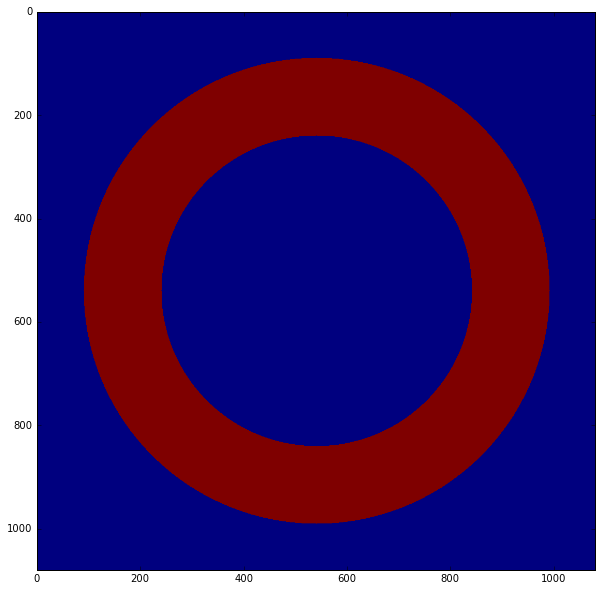

In [42]:
intensity = 2
width=height=2*r2

def is_point_inside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) <= r:
        return True
    return False

def is_point_outside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) > r:
        return True
    return False

border = np.int(r2/5)
x_range = np.arange(-r2-border,r2+border)
y_range = np.arange(-r2-border,r2+border)

circle_matrix_bool = np.empty([len(y_range), len(x_range)], dtype=np.bool)
for x in x_range:
    for y in y_range:
        _result = is_point_inside_circle(x, y, r2)
        if _result:
            _result = is_point_outside_circle(x, y, r1)
        circle_matrix_bool[x+r2+border, y+r2+border] = _result
        
circle_matrix = np.zeros([len(y_range), len(x_range)])
circle_matrix[circle_matrix_bool] = intensity

fig =  plt.figure(figsize=(10,10))
ax_img = plt.subplot(111)
ax_img.imshow(circle_matrix)

### Get Projected Image Over x-axis 

In [43]:
projected_image = np.sum(circle_matrix, axis=0)

trace = go.Scatter(y=projected_image)
layout = go.Layout(title="Projected Image",
                  xaxis=dict(title="Counts"),
                  yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [44]:
# find center, radius and truncate array

center = np.int(len(x_range)/2)
radius = r2

projected_image_only = projected_image[center - radius:center + radius + 1]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

### Apply Correction to Recover from Inhomogeneous Profile

In [45]:
def factor_inho(position=0, inner_circle_r=1, outer_circle_r=1):
    _value = inhomogeneous_correction(position=position, 
                                      inner_circle_r=inner_circle_r, 
                                      outer_circle_r=outer_circle_r)
    if position == 0:
        return 1
    if _value == 0:
        _value = np.NaN
    return (2*(r2-r1)/_value)

In [48]:
d = np.arange(-r2, r2)
intensity = projected_image_only[np.int(len(projected_image_only)/2)]/(2*(r2-r1))

expected_array = []
for _index, x in enumerate(d):
    measure = projected_image_only[_index]
    _coeff = factor_inho(position=x, inner_circle_r=r1, outer_circle_r=r2)
    expected_array.append((measure * _coeff)/(intensity))

trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title="",
                            range=[0,310]))

figure2 = go.Figure(data=[trace], layout=layout)
iplot(figure2)